In [1]:
import random
import os
import copy
os.environ["OMP_NUM_THREADS"] = "1"
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import torch
import cv2
import warnings
import timeit
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from torch import optim
from scipy.special import expit
from skimage import io, transform, measure
from sklearn import metrics
import optuna
from config import *
from util import *
from models import *
sns.set()
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
rc = {"figure.figsize" : (9, 7),
      "axes.spines.left" : False,
      "axes.spines.right" : False, 
      "axes.spines.bottom" : False,
      "axes.spines.top" : False,
      "xtick.bottom" : True,
      "xtick.labelbottom" : False,
      "ytick.labelleft" : False,
      "ytick.left" : True,
      "axes.grid" : False}
plt.rcParams.update(rc)

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
metadata = pd.read_csv(metadata_file)

test_set_group = '3'
test_set = pd.read_csv("../data/test_set"+test_set_group+".csv")

model = CharacteristicsClassifier()
model.load_state_dict(torch.load("models/combined_model.pth"))
model.to(device)
model.eval()
if next(model.parameters()).is_cuda:
    print('Model is on GPU')
else:
    print('Model is on CPU')

Model is on CPU


In [3]:
image_batch = []
for image_id in test_set.image_id.values:
    if "ISIC" in image_id:
        extension = '.jpg'
        image = io.imread(os.path.join(img_dir, image_id + extension))
        image = model.test_transform(image=image)['image']
    else:
        extension = '.png'
        image = io.imread(os.path.join(img_dir, image_id + extension), as_gray=False)[:,:,:3]
        image = model.test_transform(image=image)['image']
    image_batch.append(image)
    
image_batch = torch.stack(image_batch).to(device)

if image_batch.is_cuda:
    print('Image batch is on GPU')
else:
    print('Image batch is on CPU')

Image batch is on CPU


In [4]:
def forward(x):
    output = model.base_model(x)
    diagnosis_output = model.diagnosis_head(output)
    characteristics_output = model.characteristics_head(output)
    
    attributions = torch.cat([model.attribute(characteristics_output, class_idx) for class_idx in range(model.num_classes)], dim=1)
    attributions = F.interpolate(attributions, size=(image_size, image_size), mode='bilinear')
    return diagnosis_output, characteristics_output, attributions

In [5]:
diagnosis_output, characteristics_output, attributions = forward(image_batch)
predictions = torch.where(diagnosis_output >= model.dx_threshold, 1, 0).cpu().numpy().flatten()
char_predictions = torch.where(characteristics_output >= model.char_threshold, 1, 0).cpu().numpy()

In [6]:
explanations = []
for i in range(len(test_set)):
    print(test_set.iloc[i].image_id)
    if test_set.iloc[i].prediction == 1:
        idx = char_predictions[i][0:len(mel_class_labels)]
        print(np.array(mel_class_labels)[idx.astype(bool)])
        print(char_class_labels)
        print(expit(characteristics_output[i].detach().cpu().numpy()))
        
        explanation = mel_class_labels[characteristics_output[i][0:len(mel_class_labels)].argmax().item()]
        explanations.append(explanation)
    else:
        idx = char_predictions[i][len(mel_class_labels):]
        print(np.array(nev_class_labels)[idx.astype(bool)])
        print(char_class_labels)
        print(expit(characteristics_output[i].detach().cpu().numpy()))
        
        explanation = nev_class_labels[characteristics_output[i][len(mel_class_labels):].argmax().item()]
        explanations.append(explanation)
        
    print()
test_set['explanation'] = explanations

ISIC_0028183
['SPC' 'APC' 'OPC' 'MVP']
['TRBL', 'BDG', 'GP', 'WLSA', 'PRL', 'PV', 'SPC', 'APC', 'OPC', 'MVP']
[0.15164699 0.17535043 0.19153318 0.17379884 0.25490877 0.19228448
 0.87749964 0.83412474 0.80507207 0.8181884 ]

ISIC_0028139
['SPC' 'APC' 'OPC']
['TRBL', 'BDG', 'GP', 'WLSA', 'PRL', 'PV', 'SPC', 'APC', 'OPC', 'MVP']
[0.2791365  0.2741549  0.27317315 0.18185769 0.37689775 0.17579333
 0.7593969  0.92449707 0.71986985 0.25916865]

ISIC_0031646
['SPC' 'APC' 'OPC' 'MVP']
['TRBL', 'BDG', 'GP', 'WLSA', 'PRL', 'PV', 'SPC', 'APC', 'OPC', 'MVP']
[0.32415113 0.31032488 0.3201436  0.24114275 0.4216949  0.2478719
 0.7771524  0.8538934  0.774345   0.5198792 ]

ISIC_0030962
['SPC' 'APC' 'OPC' 'MVP']
['TRBL', 'BDG', 'GP', 'WLSA', 'PRL', 'PV', 'SPC', 'APC', 'OPC', 'MVP']
[0.13699636 0.15576835 0.13639161 0.17298618 0.23623067 0.12463647
 0.8289676  0.7652066  0.83819026 0.64386445]

ISIC_0029179
['SPC' 'APC' 'OPC' 'MVP']
['TRBL', 'BDG', 'GP', 'WLSA', 'PRL', 'PV', 'SPC', 'APC', 'OPC', 'MVP']
[

## XAI

image_id: ISIC_0028183
prediction: 0
explanation: SPC

image_id: ISIC_0028139
prediction: 0
explanation: APC

image_id: ISIC_0031646
prediction: 0
explanation: APC

image_id: ISIC_0030962
prediction: 0
explanation: OPC

image_id: ISIC_0029179
prediction: 0
explanation: SPC

image_id: ISIC_0031353
prediction: 0
explanation: APC

image_id: ISIC_0026588
prediction: 0
explanation: APC

image_id: ISIC_0030664
prediction: 0
explanation: MVP

image_id: ISIC_0033901
prediction: 1
explanation: PRL

image_id: ISIC_0033299
prediction: 1
explanation: WLSA

image_id: ISIC_0032396
prediction: 1
explanation: GP

image_id: ISIC_0033362
prediction: 1
explanation: PRL

image_id: ISIC_0030281
prediction: 0
explanation: APC

image_id: ISIC_0033496
prediction: 1
explanation: GP

image_id: ISIC_0030843
prediction: 0
explanation: APC

image_id: ISIC_0029216
prediction: 1
explanation: GP



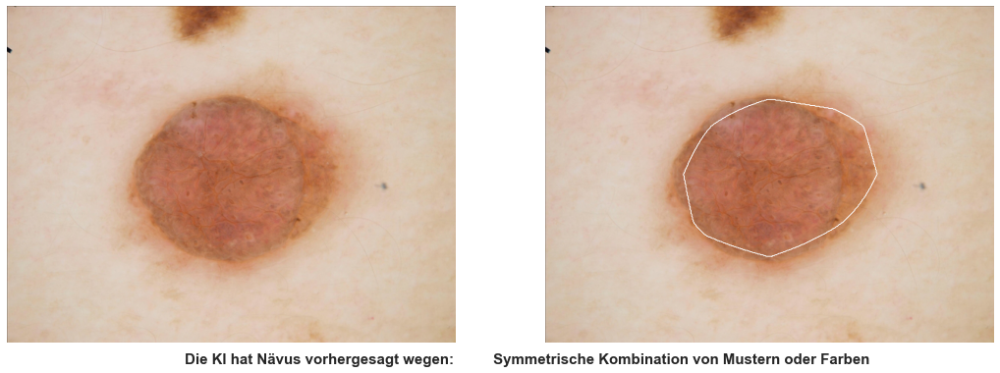

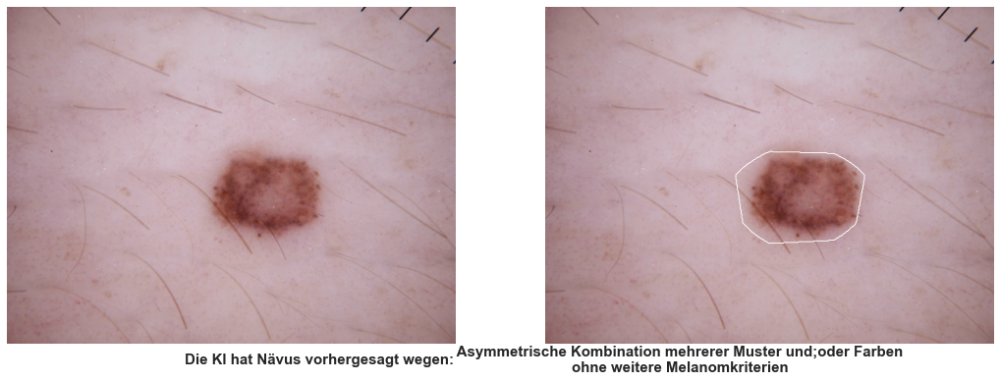

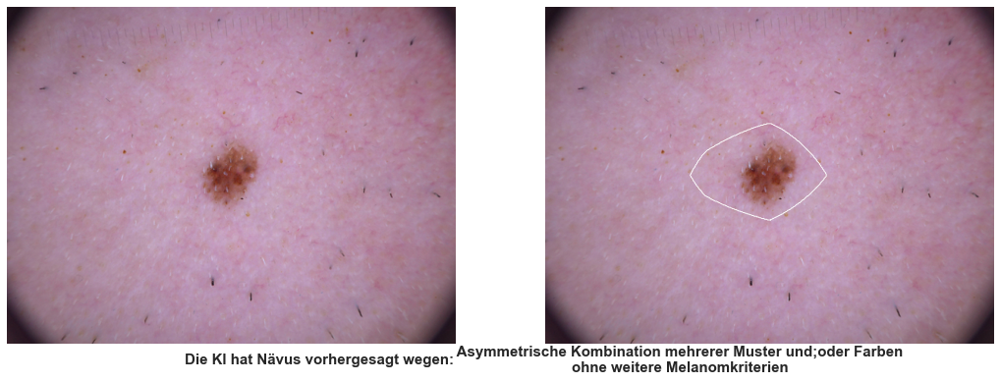

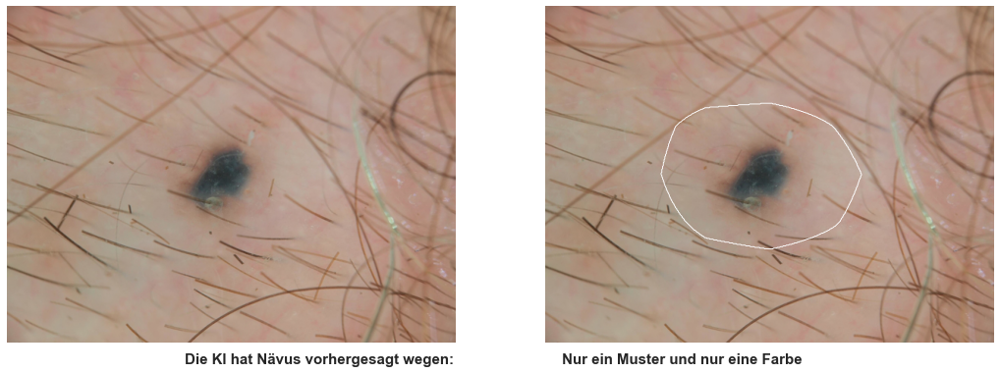

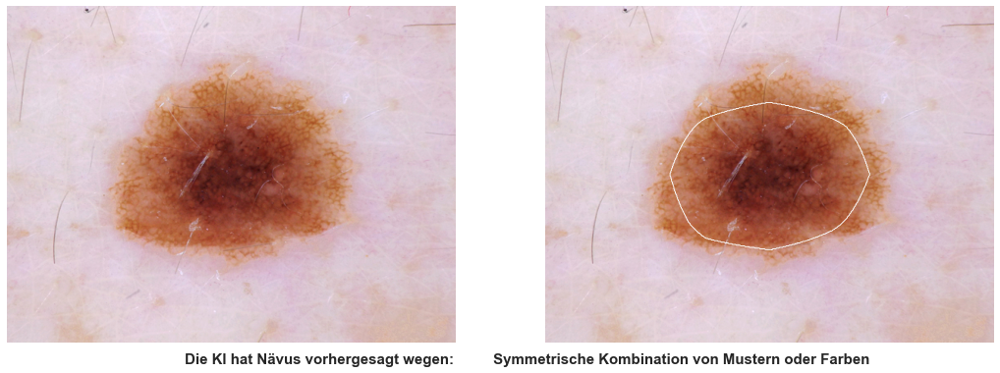

...

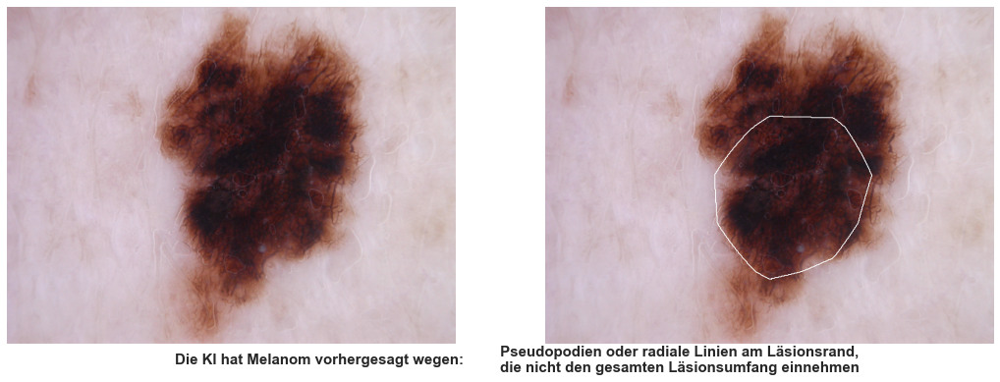

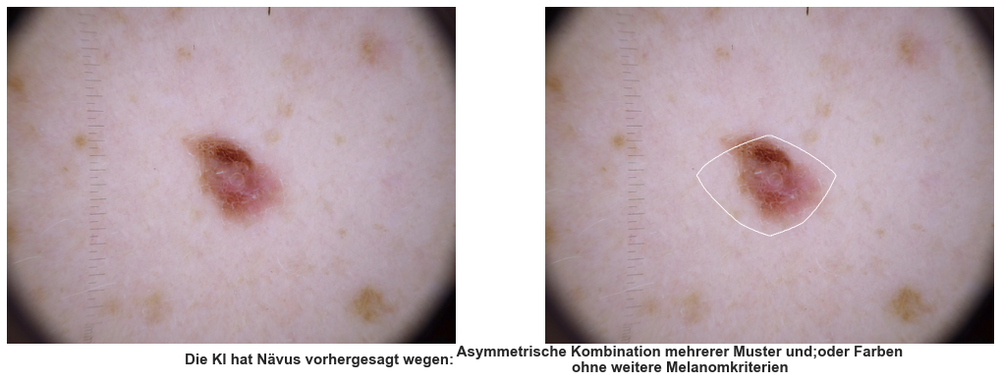

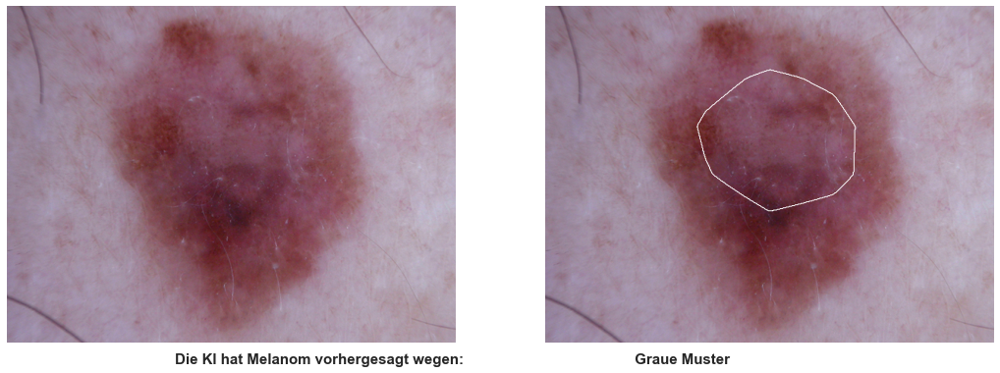

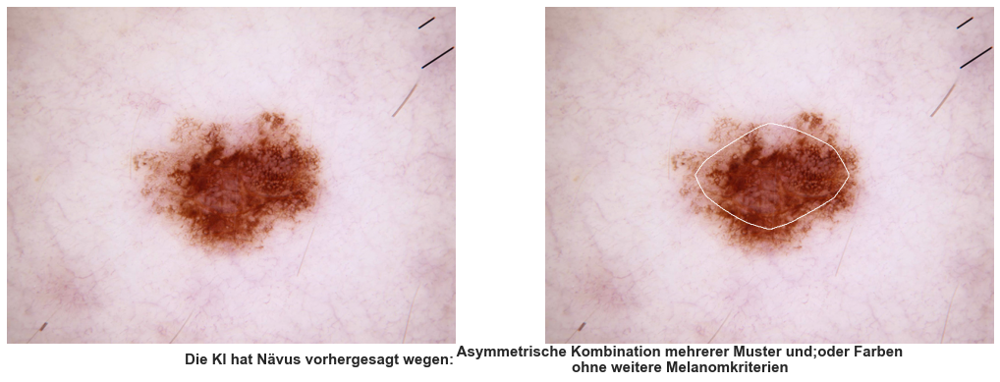

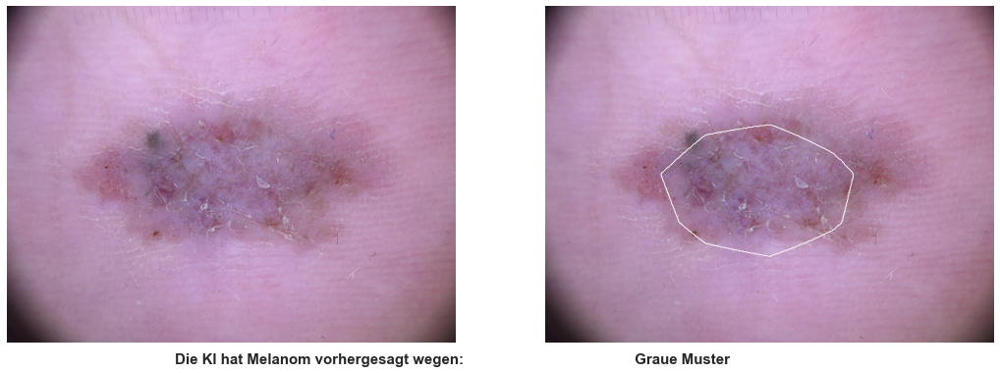

In [7]:
mappings = {
    0: 'Nävus',
    1: 'Melanom',
    'TRBL': 'Dicke retikuläre oder verzweigte Linien',
    'BDG': 'Schwarze Punkte oder Schollen',
    'GP': 'Graue Muster',
    'WLSA': 'Weiße Linien oder weißes strukturloses Areal',
    'PRL': 'Pseudopodien oder radiale Linien am Läsionsrand, \ndie nicht den gesamten Läsionsumfang einnehmen',
    'PV': 'Polymorphe Gefäße',
    'SPC': 'Symmetrische Kombination von Mustern oder Farben',
    'APC': 'Asymmetrische Kombination mehrerer Muster und;oder Farben \nohne weitere Melanomkriterien',
    'OPC': 'Nur ein Muster und nur eine Farbe',
    'MVP': 'Monomorphes Gefäßmuster'
}

for idx, row in test_set.iterrows():
    print('image_id:', row.image_id)
    print('prediction:', row.prediction)
    print('explanation:', row.explanation)
    try:
        img = io.imread(os.path.join(img_dir, row.image_id+'.png'))
    except:
        img = io.imread(os.path.join(img_dir, row.image_id+'.jpg'))
    img = transform.resize(img, (450, 600))

    attr = attributions[idx][char_class_labels.index(row.explanation)].cpu().detach().numpy()
    attr = transform.resize(attr, (450, 600))
        
    attr_non_zero = attr[attr>0.]
    if len(attr_non_zero) == 0:
        perc = 0
    else:
        perc = (np.percentile(attr_non_zero, 85))
    attr = (attr >= perc)
    
    
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 8))
    contours = measure.find_contours(attr)
    for contour in contours:
        ax[1].plot(contour[:, 1], contour[:, 0], linewidth=0.9, color='white')
    
    ax[0].imshow(img)
    ax[1].imshow(img)
    #plt.title(f"AI Prediction: {mappings[row.prediction]}", fontsize=15, fontweight='bold')
    text = f"Die KI hat {mappings[row.prediction]} vorhergesagt wegen: "
    ax[0].text(0.7, -0.05, text, fontsize=15, ha='center', va='center', weight='bold', transform=ax[0].transAxes)
    text = f" {mappings[row.explanation]}"
    ax[1].text(0.3, -0.05, text, fontsize=15, ha='center', va='center', weight='bold', transform=ax[1].transAxes)
    ax[1].axis('off')
    ax[0].axis('off')
    #plt.tight_layout()
    plt.savefig(os.path.join("../figures_xai", "group"+test_set_group, row.image_id+'.jpg'), dpi=300, bbox_inches='tight')

    print()

In [53]:
import json 
dice_scores = []
def dice_score(image1, image2):
    intersection = np.logical_and(image1, image2)
    dice = 2.0 * intersection.sum() / (image1.sum() + image2.sum())
    return dice

for idx, row in test_set.iterrows():
    try:
        img = io.imread(os.path.join(img_dir, row.image_id+'.png'))
    except:
        img = io.imread(os.path.join(img_dir, row.image_id+'.jpg'))
    img = transform.resize(img, (450, 600))
    
    attr = attributions[idx][char_class_labels.index(row.explanation)].cpu().detach().numpy()
    # attr = transform.resize(attr, (450, 600))
        
    attr_non_zero = attr[attr>0.]
    if len(attr_non_zero) == 0:
        perc = 0
    else:
        perc = (np.percentile(attr_non_zero, 85))
    attr = (attr >= perc).astype(int)
    
    with open(os.path.join(annotations_dir, image_id+'.json'), 'r') as f:
        y_annotations = json.loads(json.load(f))
        try:
            annotation = np.array(y_annotations[row.explanation])
        except:
            continue
    
    dice_scores.append(dice_score(annotation, attr))

In [54]:
np.array(dice_scores).mean()

0.3701849275261419

## AI

image_id: ISIC_0028183
prediction: 0
explanation: SPC

image_id: ISIC_0028139
prediction: 0
explanation: APC

image_id: ISIC_0031646
prediction: 0
explanation: APC

image_id: ISIC_0030962
prediction: 0
explanation: OPC

image_id: ISIC_0029179
prediction: 0
explanation: SPC

image_id: ISIC_0031353
prediction: 0
explanation: APC

image_id: ISIC_0026588
prediction: 0
explanation: APC

image_id: ISIC_0030664
prediction: 0
explanation: MVP

image_id: ISIC_0033901
prediction: 1
explanation: PRL

image_id: ISIC_0033299
prediction: 1
explanation: WLSA

image_id: ISIC_0032396
prediction: 1
explanation: GP

image_id: ISIC_0033362
prediction: 1
explanation: PRL

image_id: ISIC_0030281
prediction: 0
explanation: APC

image_id: ISIC_0033496
prediction: 1
explanation: GP

image_id: ISIC_0030843
prediction: 0
explanation: APC

image_id: ISIC_0029216
prediction: 1
explanation: GP



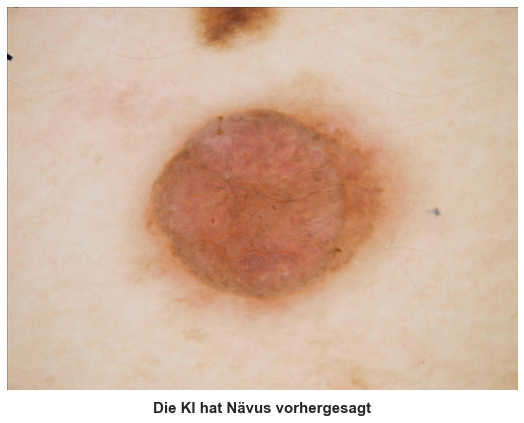

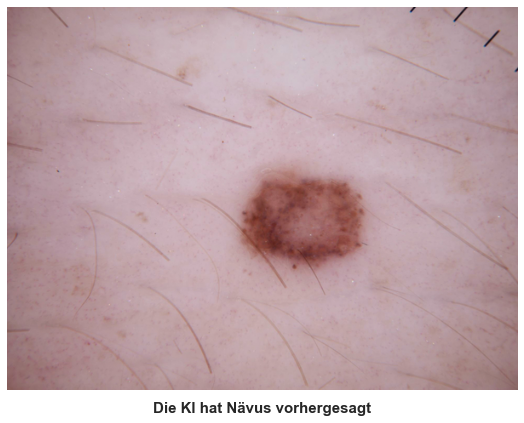

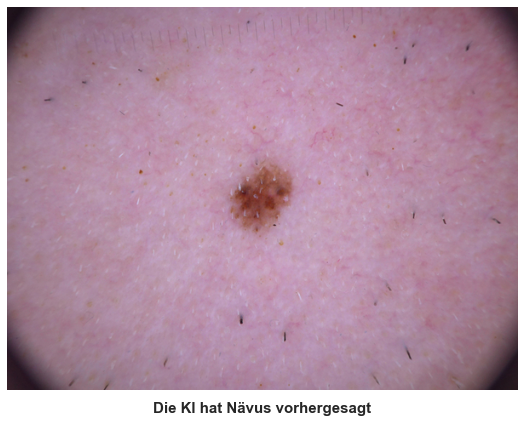

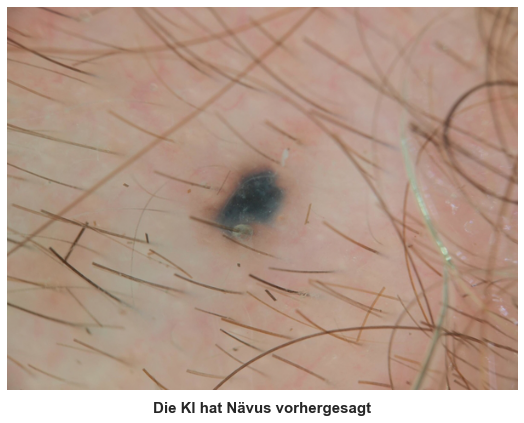

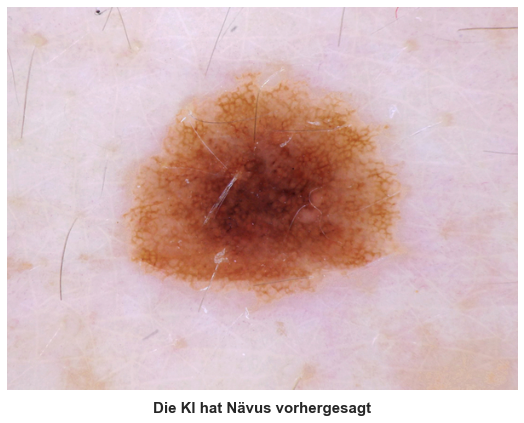

...

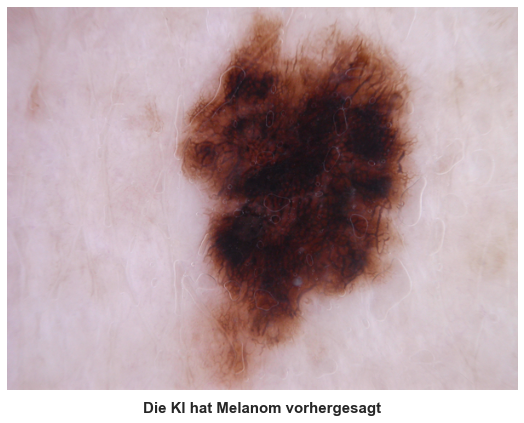

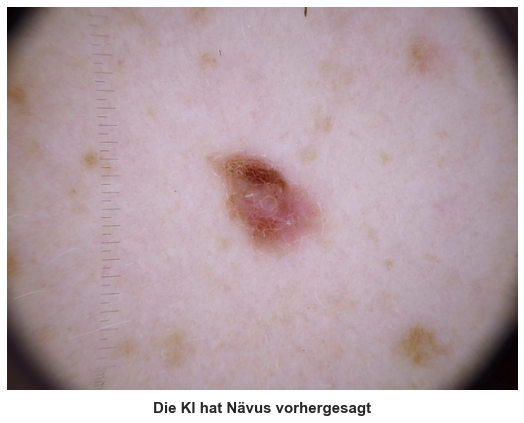

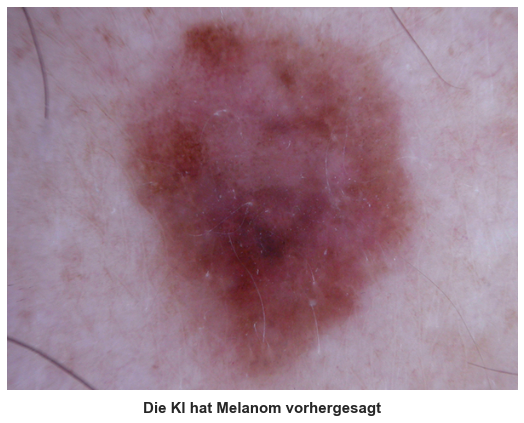

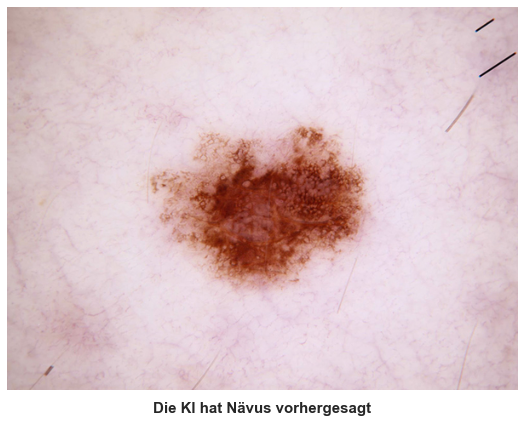

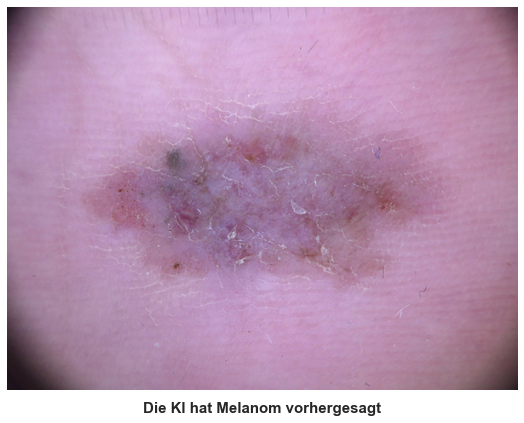

In [9]:
mappings = {
    0: 'Nävus',
    1: 'Melanom',
    'TRBL': 'Dicke retikuläre oder verzweigte Linien',
    'BDG': 'Schwarze Punkte oder Schollen',
    'GP': 'Graue Muster',
    'WLSA': 'Weiße Linien oder weißes strukturloses Areal',
    'PRL': 'Pseudopodien oder radiale Linien am Läsionsrand, \ndie nicht den gesamten Läsionsumfang einnehmen',
    'PV': 'Polymorphe Gefäße',
    'SPC': 'Symmetrische Kombination von Mustern oder Farben',
    'APC': 'Asymmetrische Kombination mehrerer Muster \nund;oder Farben',
    'OPC': 'Nur ein Muster und nur eine Farbe',
    'MVP': 'Monomorphes Gefäßmuster'
}

for idx, row in test_set.iterrows():
    print('image_id:', row.image_id)
    print('prediction:', row.prediction)
    print('explanation:', row.explanation)
    try:
        img = io.imread(os.path.join(img_dir, row.image_id+'.png'))
    except:
        img = io.imread(os.path.join(img_dir, row.image_id+'.jpg'))
    img = transform.resize(img, (450, 600))
    
    attr = attributions[idx][char_class_labels.index(row.explanation)].cpu().detach().numpy()
    attr = transform.resize(attr, (450, 600))
        
    attr_non_zero = attr[attr>0.]
    if len(attr_non_zero) == 0:
        perc = 0
    else:
        perc = (np.percentile(attr_non_zero, 85))
    attr = (attr >= perc)
    
    
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 6))
    ax.imshow(img)

    text = f"Die KI hat {mappings[row.prediction]} vorhergesagt"
    ax.text(0.5, -0.05, text, fontsize=15, ha='center', va='center', weight='bold', transform=ax.transAxes)
    text = f"because of {mappings[row.explanation]}"
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join("../figures_ai", "group"+test_set_group, row.image_id+'.jpg'), dpi=300, bbox_inches='tight')
        
    print()

